In [1]:
import copy
import csv
import cvxpy
import datetime
import json
import math
import matplotlib.pyplot as plt
import multiprocessing
from multiprocessing import Pool
import numpy as np
import os
import pandas as pd
import pickle
import random
import seaborn as sns
from typing import List, Dict
import sys
sys.path.append('../')

from tqdm import tqdm

from skyburst import Job
from skyburst.plot import *
from skyburst.traces import philly
from skyburst.traces import philly_utils

import logging
logger = logging.getLogger()

logging.basicConfig(stream=sys.stdout, level=logging.INFO)

In [33]:
jobs = philly.load_philly_traces('~/philly-traces/trace-data')
jobs.sort(key=lambda j: j._submitted_time)
all_jobs = jobs

def plot_empty_space(jobs, num_nodes, snapshots, plot=True):
    jobs = jobs.copy()
    NUM_COLORS = len(jobs['idx'])
    total_jobs = NUM_COLORS
    cm = plt.get_cmap('gist_rainbow')
    colors = [cm(1. * i / NUM_COLORS) for i in range(NUM_COLORS)]
    fig, ax = plt.subplots(figsize=(100, 50))
    total_gpus = num_nodes * GPUS_PER_NODE

    max_time = np.max(jobs['start'] + jobs['runtime'])
    gpu_id_to_segments = {}
    for j_idx in range(total_jobs):
        allocated_gpus = jobs['allocated_gpus'][j_idx]
        if not allocated_gpus:
            continue
        for node_idx in allocated_gpus.keys():
            for node_gpu_idx in allocated_gpus[node_idx]:
                gpu_idx = total_gpus - (GPUS_PER_NODE * node_idx +
                                        node_gpu_idx)
                if gpu_idx not in gpu_id_to_segments:
                    gpu_id_to_segments[gpu_idx] = []
                
                gpu_id_to_segments[gpu_idx].append((jobs['start'][j_idx], \
                                                    jobs['start'][j_idx] + jobs['runtime'][j_idx]))
    
    for key in gpu_id_to_segments.keys():
        gpu_id_to_segments[key].sort(key=lambda x: x[0])
                
    total_wasted_space = 0.0
    online_wasted_space = 0.0           
    gpu_id_to_antisegments = {}
    time_to_antisegments = {}
    for idx in range(total_gpus):
        if idx not in gpu_id_to_segments:
            if idx not in gpu_id_to_antisegments:
                gpu_id_to_antisegments[idx] = []
            new_seg = (0, max_time)
            if 0 not in time_to_antisegments:
                time_to_antisegments[0] = []
            gpu_id_to_antisegments[idx].append(new_seg)
            time_to_antisegments[0].append((idx-1, max_time))
            continue
        segments = gpu_id_to_segments[idx]
        start_time =0
        cur_segment = (0, 0)
        for seg_idx in range(len(segments)):
            next_segment = segments[seg_idx]
            if idx not in gpu_id_to_antisegments:
                gpu_id_to_antisegments[idx] = []
            if cur_segment[1] == next_segment[0]:
                cur_segment = next_segment
                continue
            antisegment = (cur_segment[1], next_segment[0])
            antisegment_width = antisegment[1]-antisegment[0]
            if antisegment_width <0:
                import pdb; pdb.set_trace()
            gpu_id_to_antisegments[idx].append(antisegment)
            if cur_segment[1] not in time_to_antisegments:
                time_to_antisegments[cur_segment[1]] = []
            time_to_antisegments[cur_segment[1]].append((idx-1, antisegment_width))
            total_wasted_space += antisegment_width
            cur_segment = next_segment
        
        if cur_segment[1] < max_time:
            new_segment = (cur_segment[1], max_time)
            gpu_id_to_antisegments[idx].append(new_segment)
            new_segment_width = max_time - cur_segment[1]
            total_wasted_space += new_segment_width
            if cur_segment[1] not in time_to_antisegments:
                time_to_antisegments[cur_segment[1]] = []
            time_to_antisegments[cur_segment[1]].append((idx-1, new_segment_width))


    asdf = []
    space_wasted = {'No Q': 0, 'HoL': 0, 'Insuff': 0}
    for time in sorted(time_to_antisegments):
        # Give time to reach STEADY state
#         if time < 1000 or time > 2000:
#             continue
        tuples = time_to_antisegments[time]
        queue = snapshots[time]['new_queue']
        num_empty_gpus = len(tuples)
        node_idx = [int(t[0]/8) for t in tuples]
        # Dict that maps node index to list of index in tuples (gpu_idx, width)
        node_free_gpus = {}
        for i, n in enumerate(node_idx):
            if n not in node_free_gpus:
                node_free_gpus[n] = []
            node_free_gpus[n].append(tuples[i])
            
        if len(queue) ==0:
            color = 'tab:blue'
            for gpu_idx, width in tuples:
                end_segment = not (time!=0 and time + width!= max_time)
                if not end_segment:
                    if not (time < 1000 or time > 2000):
                        space_wasted['No Q'] += width
                    if plot:
                        ax.barh(gpu_idx+1,
                            width=width,
                            #edgecolor='black',
                            height=1.0,
                            left=time,
                            align='edge',
                            color='tab:blue')
                else:
                    if plot:
                        ax.barh(gpu_idx+1,
                            width=width,
                            #edgecolor='black',
                            height=1.0,
                            left=time,
                            align='edge',
                            color='black')
        else:
            cannot_fit_jobs = []
            for q_job in queue:
                num_gpus = q_job.num_gpus
                if num_gpus > num_empty_gpus:
                    continue
                if num_gpus > 8:
                    job_gpu_demands = [8]*int(num_gpus/8)
                    if num_gpus%8:
                        job_gpu_demands.append(num_gpus%8)
                else:
                    job_gpu_demands = [num_gpus]
                
                job_gpu_idx =0
                node_idx_lookup = []
                can_fit = False
                for node_idx, tuple_idx_list in node_free_gpus.items():
                    if job_gpu_demands[job_gpu_idx] <=len(tuple_idx_list):
                        job_gpu_idx+=1
                        node_idx_lookup.append(node_idx)

                    if job_gpu_idx == len(job_gpu_demands):
                        can_fit=True
                        break
                
                # Head of the line blocking
                if can_fit:
                    for idx, node_idx in enumerate(node_idx_lookup):
                        color_tuples = node_free_gpus[node_idx][:job_gpu_demands[idx]]
                        for gpu_idx, width in color_tuples:
                            end_segment = not (time!=0 and time + width!= max_time)
                            if not end_segment:
                                if not (time < 1000 or time > 2000):
                                    space_wasted['HoL'] += width
                                color='tab:orange'
                            else:
                                color = 'black'
                            if plot:
                                ax.barh(gpu_idx+1,
                                    width=width,
                                    height=1.0,
                                    left=time,
                                    align='edge',
                                    color=color)
                        node_free_gpus[node_idx] = node_free_gpus[node_idx][job_gpu_demands[idx]:]
                        num_empty_gpus -= job_gpu_demands[idx]
                else:
                    cannot_fit_jobs.append(q_job)
            # Remaining jobs that can't be fit. Either due to fragmentation or not enough GPU(s)
            cannot_fit_jobs = [j.num_gpus for j in cannot_fit_jobs]
            cannot_fit_jobs.sort()
            cumsum = np.cumsum(cannot_fit_jobs)
            cumsum = [x for x in cumsum if x < num_empty_gpus]
            queue_gpus = max(cumsum) if len(cumsum)>0 else 0

            gpu_counter =0
            for tuples_list in node_free_gpus.values():
                for gpu_idx, width in tuples_list:
                    end_segment = not (time!=0 and time + width!= max_time)
                    if not end_segment:
                        if gpu_counter < queue_gpus:
                            reason_key = 'Insuff'
                            color = 'tab:green' 
#                             reason_key = 'Frag'
#                             color = 'blue'
                        else:
                            # Just not enough nodes
                            reason_key = 'Insuff'
                            color = 'tab:green'
                        if not (time < 1000 or time > 2000):
                            space_wasted[reason_key] += width
                    else:
                        color='black'
                    if plot:
                        ax.barh(gpu_idx+1,
                            width=width,
                            height=1.0,
                            left=time,
                            align='edge',
                            color=color)
                    gpu_counter+=1
    if plot:
        for i in range(total_gpus + 1):
            multiplier = math.ceil(num_nodes / 32)
            if (i + 1) % GPUS_PER_NODE == 1:
                plt.axhline(y=i + 1, linewidth=8 / multiplier, color='brown')
            else:
                plt.axhline(y=i + 1,
                            linewidth=1 / multiplier,
                            color='black',
                            linestyle='--')


        plt.ylim(bottom=1, top=total_gpus + 1)
        #plt.xlim(left=0, right=3000)
        plt.xlim(left=1000, right=2100)
    #     plt.axvline(x=max_time, color='black', linewidth=5)
        plt.tight_layout()
        plt.show()
    total_space_wasted = 0
    for k,v in space_wasted.items():
        total_space_wasted += v
        print(f'{k}: {v}')
    patches, texts = plt.pie(list(space_wasted.values()))
    plt.legend(patches, list(space_wasted.keys()))
    plt.show()
    cloud_cost = 0
    for j_idx in range(total_jobs):
        if jobs['arrival'][j_idx] >= 1000 and jobs['arrival'][j_idx] <=2000:
            if jobs['state'][j_idx]!='LOCAL':
                cloud_cost += jobs['num_gpus'][j_idx] * jobs['runtime'][j_idx]
    space_wasted['cloud_cost'] = cloud_cost
#     patches, texts = plt.pie(list(space_wasted.values())[1:])
#     plt.legend(patches, list(space_wasted.keys())[1:])
#     plt.show()
    print(f'Total Cloud Cost: {cloud_cost}')
    print(f'Total Wasted Space: {total_space_wasted}')
    return space_wasted

def plot_empty_cost_bar(dict_temp, file_path='figures/motivation/high_load.pdf'):
    dict_temp_1 = copy.deepcopy(dict_temp)
    x = [0,1,2,4,8]
    
    plt.rcParams.update({'font.size': 18})
    fig, ax1 = plt.subplots(figsize=(10, 7))
    ax2 = ax1.twinx()
    
    ax1.grid(True)
    ax1.spines['top'].set_visible(False)
    ax1.spines['right'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.spines['bottom'].set_color('#DDDDDD')
    ax2.spines['top'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['bottom'].set_color('#DDDDDD')
    ax1.tick_params(bottom=False, left=False)
    ax1.set_axisbelow(True)
    ax1.yaxis.grid(False, color='#EEEEEE')
    ax1.xaxis.grid(False)
    ax2.tick_params(bottom=False, left=False)
    ax2.set_axisbelow(True)
    ax2.xaxis.grid(False)

    labels = ['No Q', 'HoL', 'Insuff']
    # plot the bars
    bar_width = 0.25

    # plot the bars for each label separately
    # Normalize
    temp = []
    for i, label in enumerate(labels):
        temp.extend([dict_temp[key][label] for key in x])
    max_space = max(temp)
    for i, label in enumerate(labels):
        if max_space == 0.0:
            values = np.array([dict_temp[key][label] for key in x])
        else:
            values = np.array([dict_temp[key][label] for key in x])/max_space
        offset = i * bar_width
        ax1.bar(np.arange(len(x)) + offset, values, bar_width, alpha=1.0, label=label)

    cloud_cost = []
    for idx in x:
        cloud_cost.append(dict_temp[idx]['cloud_cost'])
    cloud_cost = np.array(cloud_cost)
    # Normalize
    if np.max(cloud_cost)!=0:
        cloud_cost = cloud_cost/np.max(cloud_cost)
    
    # add title and axis labels
    ax1.set_xlabel('Waiting time (τ)')
    ax1.set_ylabel('Empty Space')
    ax1.set_xticks(np.arange(len(x)) + bar_width, labels=x)
    # add legend
    ax1.legend(loc='upper left')    
        
    
    
    ax2.plot(np.arange(len(x)), cloud_cost, color='black', marker='o', label='Cloud Costs')

    # add second y-axis label
    ax2.set_ylabel('Cloud Costs')
    # add legend for second y-axis
    ax2.legend(loc='upper right')
    ax2.tick_params(labelright='off')  
    plt.tight_layout()
    plt.savefig(file_path, bbox_inches="tight")
    # show the plot
    plt.show()

In [29]:
from math import floor, ceil

# Maximum job time in hours
CLIP_MAX_TIME = 1e9

# Deadline Multiplier d_t = a_t + K * r_t
DEADLINE_CONSTANT = 1.25

# Returns the deadline of a job.
# For continuous simulator
def deadline_mult_fn(arrival_time, run_time, resource_dict, deadline_mult=DEADLINE_CONSTANT):
    waiting_time = (deadline_mult - 1)*run_time
    waiting_time = max(1/12.0, waiting_time)
    return arrival_time + waiting_time + run_time


def deadline_mult_cap_fn(arrival_time, run_time, resource_dict, deadline_mult=DEADLINE_CONSTANT):
    waiting_time = (deadline_mult - 1)*run_time
    waiting_time = min(48, max(1/12.0, waiting_time))
    return arrival_time + waiting_time + run_time

def deadline_ljw(arrival_time, run_time, resource_dict, deadline_mult=DEADLINE_CONSTANT, run_thres=8.0):
    if run_time < run_thres:
        return arrival_time + run_time
    waiting_time = (deadline_mult - 1)*run_time
    return arrival_time + waiting_time + run_time

def deadline_infinite_fn(arrival_time, run_time, resource_dict):
    return 1e12

def deadline_zero_fn(arrival_time, run_time, resource_dict):
    return arrival_time + run_time

def deadline_constant_fn(arrival_time, run_time, resource_dict, wait_time=1):
    return arrival_time + wait_time + run_time

def deadline_linear_capacity_fn(arrival_time, run_time, resource_dict, deadline_mult=1):
    return arrival_time + deadline_mult * resource_dict['GPUs'] + run_time

def deadline_quad_capacity_fn(arrival_time, run_time, resource_dict, deadline_mult=1):
    return arrival_time + deadline_mult * (resource_dict['GPUs']**2) + run_time

def deadline_log_capacity_fn(arrival_time, run_time, resource_dict, deadline_mult=1):
    if resource_dict['GPUs'] ==0:
        return arrival_time + run_time
    return arrival_time + deadline_mult * (1+np.log2(resource_dict['GPUs'])) + run_time

def deadline_area_fn(arrival_time, run_time, resource_dict, deadline_mult=1):
    return arrival_time + deadline_mult * resource_dict['GPUs'] * run_time + run_time

# Returns the total cost of a job.
def gpu_cost_fn(resources: dict, run_time: float):
    return resources['GPUs'] * run_time

def time_thres_fn(job, run_thres):
    return job.runtime >= run_thres

# NUM_GPUS per node: 8
GPUS_PER_NODE = 8

# Num nodes
NUM_NODES = 16

def preprocess_jobs(jobs: List['JobTrace'], deadline_fn= deadline_infinite_fn , cost_fn=gpu_cost_fn, clip_time: float = CLIP_MAX_TIME):
    """Converts a list of jobs into (arrival_time, run_time, deadline, resources, cost).
    """
    jobs = jobs.copy()
    # Remove invalid jobs (jobs that have not finished and jobs that failed/killed early)
    jobs = [j for j in jobs if j._run_time is not None and j.status=='Pass']
    jobs.sort(key=lambda j: j._submitted_time)
    
    if not clip_time:
        clip_time = 1e9
    
    # Arrival time for jobs
    start_time = jobs[0]._submitted_time
    arrival_times = [(j._submitted_time- start_time).total_seconds()/3600.0 for j in jobs]
    
    # Run time for jobs
    run_times = []
    for j in jobs:
        # Clip the maximum run time for jobs to simplify simulation.
        run_time_hr = j._run_time/60.0
        if run_time_hr > clip_time:
            run_times.append(clip_time)
        else:
            run_times.append(run_time_hr)
    
    # Get GPU resources
    resources = []
    for j in jobs:
        detail_dict = j.attempts[-1]['detail']
        gpu_count = sum([len(node_dict['gpus']) for node_dict in detail_dict])
        resources.append({'GPUs': gpu_count})
    
    deadlines = [deadline_fn(arrival, run, resource_dict) for arrival, run, resource_dict in zip(arrival_times, run_times, resources)]
    
    
    costs = [cost_fn(res, run) for res, run in zip(resources, run_times)]
    
    return [Job(idx, arr, run, dead, res, cost) \
            for idx, (arr, run, dead, res, cost) in \
            enumerate(list(zip(arrival_times, run_times, deadlines, resources, costs)))]

def generate_steady_state(jobs: List['JobTrace'], max_time=2500, arrival_param=32.0, deadline_fn= deadline_infinite_fn , cost_fn=gpu_cost_fn):
    """Converts a list of jobs into Job(arrival_time, run_time, deadline, resources, cost).
    """
    jobs = jobs.copy()
    # Remove invalid jobs (jobs that have not finished and jobs that failed/killed early)
    jobs = [j for j in jobs if j._run_time is not None and j.status=='Pass']
    jobs.sort(key=lambda j: j._submitted_time)
    #num_jobs = len(jobs)
    
    # Arrival time for jobs
    np.random.seed(5)
    interarrival_times = np.random.exponential(scale=1/arrival_param, size=1000000)
    interarrival_times = np.insert(interarrival_times, 0, 0)
    sum_arrival_times = np.cumsum(interarrival_times)
    arrival_times = [a for a in sum_arrival_times if a <= max_time]
    if len(sum_arrival_times) == len(arrival_times):
        raise ValueError('lol')
    
    num_jobs = len(arrival_times)
    
    # Run time for jobs
    run_times = []
    for j in jobs:
        run_time_hr = j._run_time/60.0
        run_times.append(run_time_hr)

    # Get GPU resources
    resources = []
    for j in jobs:
        detail_dict = j.attempts[-1]['detail']
        gpu_count = sum([len(node_dict['gpus']) for node_dict in detail_dict])
        resources.append({'GPUs': gpu_count})
    np.random.seed(5)
    job_indexes = np.random.choice(list(range(len(run_times))), size=num_jobs, replace=True)
    proc_jobs = []
    for idx in range(num_jobs):
        job_idx = job_indexes[idx]
        #job_idx = idx
        resources_dict = resources[job_idx]
        runtime = run_times[job_idx]
        deadline = deadline_fn(arrival_times[idx], runtime, resources_dict)
        cost = cost_fn(resources_dict, runtime)
        proc_jobs.append(Job(idx, arrival_times[idx], runtime, deadline, resources_dict, cost))
    return proc_jobs

In [30]:
class Node(object):
    def __init__(self, num_gpus):
        self.num_gpus = num_gpus
        self.gpu_dict = {}
        self.reserved_gpus = {}
        for idx in range(self.num_gpus):
            self.gpu_dict[idx] = None
            self.reserved_gpus[idx] = None
        self.free_gpus = num_gpus
        
    def __repr__(self):
        return f'{self.gpu_dict}'        
        
def is_subset(list1, list2):
    indexes = []
    for i2, elem in enumerate(list2):
        for i1,x in enumerate(list1):
            if x == elem and i1 not in indexes:
                indexes.append(i1)
                break
        if len(indexes) !=  i2+1:
            return []
    return indexes

        
class Cluster(object):
    
    def __init__(self, num_nodes, num_gpus_per_node, bin_pack='first-fit', backfill = False):
        self.num_nodes = num_nodes
        self.num_gpus_per_node = num_gpus_per_node
        self.nodes = [Node(num_gpus_per_node) for _ in range(num_nodes)]
        self.active_jobs = {}
        self.reserved_jobs = {}
        self.backfill = backfill
        self.bin_pack = bin_pack
    
    def is_full(self):
        return all([n.free_gpus==0 for n in self.nodes])
    
    def try_fit_v2(self, cur_timestamp, job):
        num_gpus = job.resources['GPUs']
                        
        free_gpus = [n.free_gpus for n in self.nodes]
        node_idx_to_pre_job = {}
        
        # Quick check, no hope of fitting onto cluster :(
        if num_gpus > sum(free_gpus):
            return False, []
        
        # Generate job GPU demands
        if num_gpus > self.num_gpus_per_node:
            # Assume worst case colocation
            # Multinode case, i.e. 26 GPUs, 8 GPU/node cluster -> job_gpu_demands = [8,8,8,2]
            job_gpu_demands = [self.num_gpus_per_node]*int(num_gpus/self.num_gpus_per_node)
            if num_gpus%self.num_gpus_per_node:
                job_gpu_demands.append(num_gpus%self.num_gpus_per_node)
        else:
            job_gpu_demands = [num_gpus]

        # =============================================================================
        # Generate Job Plans
        # =============================================================================
        
        # Maps node idx to list of gpu indexes for the job to take
        node_idx_taken = {}
        remove_idx = []
        
        # Go through free space only first, generate partial plan with free space
        node_free_list = [[] for _ in range(self.num_nodes)]
        node_free_count = [0]*self.num_nodes
        for n_idx, n in enumerate(self.nodes):
            # Go through reserved nodes first
            reserved_list = []
            unreserved_list = []
            for gpu_idx in range(self.num_gpus_per_node):
                if n.reserved_gpus[gpu_idx] and n.gpu_dict[gpu_idx] is None:
                    if n.reserved_gpus[gpu_idx].start >= cur_timestamp + job.runtime:
                        reserved_list.append(gpu_idx)
                elif n.gpu_dict[gpu_idx] is None and n.reserved_gpus[gpu_idx] is None:
                    unreserved_list.append(gpu_idx)
            node_free_list[n_idx] = reserved_list + unreserved_list
            node_free_count[n_idx] = len(node_free_list[n_idx])
        
        node_free_count = [(n_idx, free_gpu) for n_idx, free_gpu in enumerate(node_free_count)]
        if self.bin_pack == 'first-fit':
            pass
        elif self.bin_pack == 'best-fit':
            node_free_count.sort(key=lambda x: x[1])
        elif self.bin_pack == 'worst-fit':
            node_free_count.sort(key=lambda x: x[1], reverse=True)
        else:
            raise ValueError(f'Invalid allocation strategy {self.bin_pack}!')
        
        for list_idx, gpu_demand in enumerate(list(job_gpu_demands)):
            for n_idx, free_gpus in node_free_count:
                if n_idx in node_idx_taken:
                    continue
                
                if free_gpus >= gpu_demand:
                    # Reserved GPUs in the beginning of list
                    node_idx_taken[n_idx] = node_free_list[n_idx][:gpu_demand]
                    job_gpu_demands.remove(gpu_demand)
                    break
        
#         for list_idx, gpu_demand in enumerate(list(job_gpu_demands)):
#             for n_idx, n in enumerate(self.nodes):
#                 if n_idx in node_idx_taken:
#                     continue
#                 gpu_list = []
#                 final_gpu_count = 0             
#                 # Go through reserved GPU(s) in node
#                 free_node_list = []
#                 for gpu_idx, r_job in n.reserved_gpus.items():
#                     if r_job is None:
#                         free_node_list.append(gpu_idx)
#                     elif r_job.start >= cur_timestamp + job.runtime and n.gpu_dict[gpu_idx] is None:
#                         final_gpu_count +=1
#                         gpu_list.append(gpu_idx)
                
#                 # Then go through non-reserved GPU(s) in node
#                 for gpu_idx in free_node_list:
#                     if n.gpu_dict[gpu_idx] is None:
#                         final_gpu_count+=1
#                         gpu_list.append(gpu_idx)

#                 if final_gpu_count >= gpu_demand:
#                     node_idx_taken[n_idx] = gpu_list[:gpu_demand]
#                     job_gpu_demands.remove(gpu_demand)
#                     break
        
        # If there are still demands that cannot be satisifed via free and preempted jobs,
        # it cannot be scheduled on the cluster.
        if job_gpu_demands:
            return False, []

        # =============================================================================
        # Execute Job Plans
        # =============================================================================
        for n_idx, gpu_demand_list in node_idx_taken.items():
            node = self.nodes[n_idx]
            node.free_gpus -= len(gpu_demand_list)
            if node.free_gpus < 0:
                import pdb; pdb.set_trace()
                raise ValueError("Should not go here!")
            for idx in gpu_demand_list:
                if node.gpu_dict[idx] is not None:
                    import pdb; pdb.set_trace()
                node.gpu_dict[idx] = job
            job.allocated_gpus[n_idx] = gpu_demand_list
        job.start = cur_timestamp
        self.active_jobs[job.idx] = job
        
        return True, []
    
    def try_reserve(self, cur_timestamp, job):
        max_timestemp = job.deadline - job.runtime
        
        free_gpus = [n.free_gpus for n in self.nodes]
        active_job_list = [a_job for a_job in self.active_jobs.values()]
        active_job_list.sort(key= lambda x: x.start + x.runtime)
                
        num_gpus = job.num_gpus
        # Generate job GPU demands
        if num_gpus > self.num_gpus_per_node:
            # Multinode case, i.e. 26 GPUs, 8 GPU/node cluster -> job_gpu_demands = [8,8,8,2]
            job_gpu_demands = [self.num_gpus_per_node]*int(num_gpus/self.num_gpus_per_node)
            if num_gpus%self.num_gpus_per_node:
                job_gpu_demands.append(num_gpus%self.num_gpus_per_node)
        else:
            job_gpu_demands = [num_gpus]
        
        
        node_free_list = [[] for _ in range(self.num_nodes)]
        node_free_count = [0]*self.num_nodes
        for n_idx, node in enumerate(self.nodes):
            for gpu_idx in range(self.num_gpus_per_node):
                if node.gpu_dict[gpu_idx] or node.reserved_gpus[gpu_idx]:
                    continue
                node_free_count[n_idx] +=1
                node_free_list[n_idx].append(gpu_idx)
        
        for a_job in active_job_list:
            if a_job.start + a_job.runtime > job.deadline - job.runtime:
                return False
            
            for n_idx, gpu_list in a_job.allocated_gpus.items():
                for gpu_idx in gpu_list:
                    if self.nodes[n_idx].reserved_gpus[gpu_idx]:
                        continue
                    node_free_list[n_idx].append(gpu_idx)
                    node_free_count[n_idx]+=1
            
            node_indexes = is_subset(node_free_count, job_gpu_demands)
            if node_indexes:
                for idx, n_idx in enumerate(node_indexes):
                    gpu_list = node_free_list[n_idx][-job_gpu_demands[idx]:]
                    job.allocated_gpus[n_idx] = gpu_list
                    cur_node = self.nodes[n_idx]
                    for gpu_idx in gpu_list:
                        cur_node.reserved_gpus[gpu_idx] = job
                self.reserved_jobs[job.idx] = job
                job.block_job_idx = a_job.idx
                job.start = a_job.start + a_job.runtime
                return True
        raise ValueError('I should not go here!')
            
    def try_clear(self, t: float):
        """Clears cluster of completed jobs.
        """
        completed_jobs = []
        for job_idx, job in self.active_jobs.items():
            if t >= job.start + job.runtime:
                for node_idx, gpu_list in job.allocated_gpus.items():
                    cur_node = self.nodes[node_idx]
                    node_gpu_dict = cur_node.gpu_dict
                    for gpu_idx in gpu_list:
                        node_gpu_dict[gpu_idx] = None
                    cur_node.free_gpus += len(gpu_list)
                completed_jobs.append(job)
        
        c_job_idx = []
        for job in completed_jobs:
            job.state = 'LOCAL'
            c_job_idx.append(job.idx)
            del self.active_jobs[job.idx]
        
        # Go through reserved jobs
        r_job_delete_idx = []
        for r_job_idx, r_job in self.reserved_jobs.items():
            # Move reserved job to active jobs
            if r_job.block_job_idx in c_job_idx:
                if t > r_job.start:
                    raise ValueError('sus')
                for node_idx, gpu_list in r_job.allocated_gpus.items():
                    cur_node = self.nodes[node_idx]
                    for gpu_idx in gpu_list:
                        cur_node.gpu_dict[gpu_idx] = r_job
                        cur_node.reserved_gpus[gpu_idx] = None
                    cur_node.free_gpus -= len(gpu_list)
                    if cur_node.free_gpus < 0:
                        import pdb; pdb.set_trace()
                r_job_delete_idx.append(r_job_idx)
                self.active_jobs[r_job_idx] = r_job
        
        for r_job_idx in r_job_delete_idx:
            del self.reserved_jobs[r_job_idx]
                             
        return completed_jobs
    
    def __repr__(self):
        repr_str = 'Cluster State:\n'
        for idx, n in enumerate(self.nodes):
            repr_str += f'Node {idx}: {n}\n'
        return repr_str

In [31]:
## Attempt Pre-emption
# Add job into the cluster -> pre empt jobs (what jobs to preempt?)
# Only preempt jobs that have reached deadline & are cheaper than the current job
# Preempted jobs go back into the queue
def continuous_simulator(jobs: List[Job], policy, num_nodes, job_filter_policy=None, snapshot=False, verbose=False, debug=False):
    original_policy_str = copy.deepcopy(policy)
    if '-' in policy:
        policy_list = policy.split('-')
        policy = policy_list[0]
        mods = policy_list[1:]
    else:
        mods = []
    
    if policy == 'fifo':
        sort_func = lambda x: x.arrival
    elif policy == 'lifo':
        sort_func = lambda x: -x.arrival
    elif policy == 'edf':
        sort_func = lambda x: x.deadline
    elif policy == 'evdf':
        sort_func = lambda x: x.deadline * x.num_gpus
    elif policy == 'ldf':
        sort_func = lambda x: -x.deadline
    elif policy == 'sjf':
        sort_func = lambda x: x.runtime
    elif policy == 'svjf':
        sort_func = lambda x: x.cost
    elif policy == 'ljf':
        sort_func = lambda x: -x.runtime
    elif policy == 'lvjf':
        sort_func = lambda x: -x.cost
    elif policy == 'swf':
        sort_func = lambda x: x.deadline - x.runtime 
    elif policy == 'svwf':
        sort_func = lambda x: (x.deadline - x.runtime)*x.num_gpus
    elif policy == 'lwf':
        sort_func = lambda x: -x.deadline + x.runtime
    else:
        pass
        #raise ValueError(f'Policy {policy} does not match!')
    
    bin_pack_policy = 'first-fit'
    remove_hol = False
    backfill = False
    for mod in mods:
        if mod == 'nohol':
            remove_hol=True
        if mod == 'backfill':
            backfill=True
        if mod == 'first':
            bin_pack_policy = 'first-fit'
        if mod == 'best':
            bin_pack_policy = 'best-fit'
        if mod == 'worst':
            bin_pack_policy = 'worst-fit'
    
    job_filter_fn = None
    if job_filter_policy is not None:
        job_filter_policy, run_thres = job_filter_policy.split('-')
        if job_filter_policy == 'ljw':
            job_filter_fn = lambda x: time_thres_fn(x, float(run_thres))
        else:
            raise ValueError(f'Incorrect job filter policy {job_filter_policy}.')
    
    finished_jobs = []
    jobs = copy.deepcopy(jobs)
    num_jobs = len(jobs)
    queue = []
    cloud_cost = 0
    cluster = Cluster(num_nodes=num_nodes, num_gpus_per_node=GPUS_PER_NODE, backfill=backfill, bin_pack=bin_pack_policy)
    t=0
    snapshots = {}
    #tqdm_iter = tqdm(total=len(jobs), desc ="# of Jobs left")
    while len(jobs) >0 or len(queue)>0 or cluster.active_jobs:
        # Clear cluster of jobs that have completed
        finished_jobs.extend(cluster.try_clear(t))
        # Check for jobs that have waited too long (move to cloud).
        i=0
        while i < len(queue):
            job = queue[i]
            if t >= job.deadline - job.runtime:
                queue.remove(job)
                job.state = 'TIMEOUT-CLOUD'
                job.start = job.deadline - job.runtime
                finished_jobs.append(job)
            else:
                i+=1
        
        # Add jobs to queue that have arrived
        i=0
        while i < len(jobs):
            job = jobs[i]
            if job.arrival < t:
                raise ValueError("Should not have entered here!")
                
            if job.arrival == t:
                jobs.remove(job)
                #tqdm_iter.update(1)
#                 if job.idx%1000==0:
#                     logging.info(f'{policy}-{num_nodes}: {job.idx}')
                if job_filter_fn is not None:
                    # If arrival job does not satisfy job filter, move job to cloud.
                    if not job_filter_fn(job):
                        job.state = 'FILTER-CLOUD'
                        finished_jobs.append(job)
                        continue
                queue.append(job)
            else:
                break
        
        if policy == 'llf':
            sort_func = lambda x: x.deadline - t - x.runtime
        elif policy == 'llfv':
            sort_func = lambda x: (x.deadline - t - x.runtime)*x.num_gpus
        queue.sort(key = sort_func)
        
        # Go through queue and fit jobs onto cluster as needed
        preempted_jobs = []
        i =0
        while i < len(queue):
            job = queue[i]
            can_fit, preempted_jobs = cluster.try_fit_v2(t, job)
            if can_fit:
                queue.remove(job)
                queue.extend(preempted_jobs)
            elif not remove_hol:
                break
            else:
                i+=1
        
        # Perform EASY backfilling
        if backfill:
            # Reserve the first element of queue that is blocking
            if queue:
                job_to_reserve = queue[0]
                can_reserve = cluster.try_reserve(t, job_to_reserve)
                # If can't reserve within reasonble time (before deadline), move the job to the cloud
                if not can_reserve:
#                     job_to_reserve.block_job_idx = 'hi'
                    pass
#                     queue.remove(job_to_reserve)
#                     job_to_reserve.state = 'FILTER-CLOUD'
#                     job_to_reserve.start = t
#                     finished_jobs.append(job_to_reserve)
                else:
                    queue.remove(job_to_reserve)
                i=0
                while i < len(queue):
                    job = queue[i]
                    can_fit, preempted_jobs = cluster.try_fit_v2(t, job)
                    if can_fit:
                        queue.remove(job)
                        queue.extend(preempted_jobs)
                    else:
                        i+=1
                    
        next_time_list = []
        if snapshot:
            if t not in snapshots:
                snapshots[t] = {}
            snapshots[t]['new_queue'] = copy.deepcopy(queue)
        
        # Skip to next timestep where a new job either arrives or when a job finishes on the cluster.
        for job_idx, job in cluster.active_jobs.items():
            release_time = job.start + job.runtime
            next_time_list.append(release_time)

        if len(jobs)>0:
            next_time_list.append(jobs[0].arrival)
        
        if len(next_time_list)==0:
            assert len(queue)==0 and len(jobs) ==0
            break
        
        if min(next_time_list) < t:
            raise ValueError('Simulator is severely bugged; Raise a Git Issue.')
                
        if verbose or debug:
            print(f'Timestamp: {t}')
            print(f'Jobs left: {len(jobs)}')
            print(f'Cloud Cost: {cloud_cost}')
            print(cluster)
            print('Queue: ' + str(queue) + '\n')
            print('Finished Jobs: ' + str(finished_jobs) + '\n')
            if debug:
                import pdb; pdb.set_trace()
        
        t = min(next_time_list)
    finished_jobs.extend(cluster.try_clear(1e12))
    assert len(jobs)==0 and len(queue)==0

    # Compute Avg. Waiting Time
    total_waiting_time = 0.0
    num_jobs = 0
    for job in finished_jobs:
        # remove warmup and cooldown period
        if job.idx < 2000 or job.idx > len(finished_jobs)-2000:
            continue
        # Moved to cloud
        if job.state == 'TIMEOUT-CLOUD':
            total_waiting_time += job.start - job.arrival
            cloud_cost += job.cost
        elif job.state == 'FILTER-CLOUD':
            assert job.start is not None
            total_waiting_time += job.start - job.arrival
            cloud_cost += job.cost
        elif job.state == 'LOCAL':
            assert job.state == 'LOCAL'
            total_waiting_time += job.start - job.arrival
        num_jobs+=1
    
    policy = original_policy_str
    print(f'{policy}-{num_nodes}')
    print(f'Cloud Cost ({policy}-{num_nodes}): {cloud_cost}')
    print(f'Avg Waiting Time ({policy}-{num_nodes}): {total_waiting_time/num_jobs}')
    print(len(finished_jobs))
    if snapshot:
        return f'{policy}-{num_nodes}', save_simulator_results(finished_jobs), snapshots
    else:
        return f'{policy}-{num_nodes}', save_simulator_results(finished_jobs)

def save_simulator_results(finished_jobs: List[Job]) -> dict:
    result_dict = {
        'idx': [],
        'arrival': [],
        'start': [],
        'runtime': [],
        'deadline': [],
        'num_gpus': [],
        'state': [],
        'allocated_gpus': [],
    }
    finished_jobs.sort(key = lambda x: x.idx)
    for job in finished_jobs:
        result_dict['idx'].append(job.idx)
        result_dict['arrival'].append(job.arrival)
        if job.start is not None:
            result_dict['start'].append(job.start)
        else:
            result_dict['start'].append(-1)
        result_dict['runtime'].append(job.runtime)
        result_dict['deadline'].append(job.deadline)
        result_dict['num_gpus'].append(job.num_gpus)
        result_dict['state'].append(job.state)
        result_dict['allocated_gpus'].append(job.allocated_gpus)
    result_dict['idx'] = np.array(result_dict['idx'])
    result_dict['arrival'] = np.array(result_dict['arrival'])
    result_dict['start'] = np.array(result_dict['start'])
    result_dict['runtime'] = np.array(result_dict['runtime'])
    result_dict['deadline'] = np.array(result_dict['deadline'])
    result_dict['num_gpus'] = np.array(result_dict['num_gpus'])
    result_dict['state'] = np.array(result_dict['state'])
    result_dict['allocated_gpus'] = np.array(result_dict['allocated_gpus'])
    return result_dict

In [6]:
# All equilvanet in terms of waiting budget
infinite_fn = lambda x,y,z: deadline_infinite_fn(x,y,z)
temp_fn = lambda x, y, z: deadline_mult_fn(x,y,z,deadline_mult=1.25)
const_fn = lambda x, y, z: deadline_constant_fn(x,y,z,wait_time=1.045615182205313)
linear_capacity_fn = lambda x,y,z: deadline_linear_capacity_fn(x,y,z, deadline_mult=0.7912912710329504)
log_capacity_fn = lambda x,y,z: deadline_log_capacity_fn(x,y,z, deadline_mult=0.9102791702708073)
quad_capacity_fn = lambda x,y,z: deadline_log_capacity_fn(x,y,z, deadline_mult=0.19027535563997805)

# noncongested_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=24.0, deadline_fn=temp_fn)
# congested_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=84.0, deadline_fn=temp_fn)
# golden_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=40.0, deadline_fn=temp_fn)

vary_overload_waiting_time = {}
for c_hours in [0,1,2,4,8]:
    const_fn = lambda x, y, z: deadline_constant_fn(x,y,z,wait_time=c_hours)
    golden_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=48.0, deadline_fn=const_fn)
    print(len(golden_jobs_proc))
    vary_overload_waiting_time[c_hours] = continuous_simulator(golden_jobs_proc, 'fifo', 64, snapshot=True)
    

# asdf1 = continuous_simulator(noncongested_jobs_proc, 'fifo', 64)
# asdf2 = continuous_simulator(congested_jobs_proc, 'fifo', 64)
# asdf3 = continuous_simulator(golden_jobs_proc, 'fifo', 64)

# jobs_proc = generate_philly_jobs(all_jobs, num_jobs=320000, deadline_fn=temp_fn)
# asdf1 = continuous_simulator(run_jobs_proc, 'fifo', 88)
# asdf2 = continuous_simulator(run_jobs_proc, 'swf', 88)


# cap_jobs_proc = preprocess_jobs(all_jobs, deadline_fn=capacity_fn)

# asdf1 = continuous_simulator(cap_jobs_proc, 'fifo', 88)
# asdf2 = continuous_simulator(cap_jobs_proc, 'swf', 88)

# asdf3 = continuous_simulator(jobs_proc, 'swf-backfill', 88)


119414
fifo-64
Cloud Cost (fifo-64): 411950.38083333307
Avg Waiting Time (fifo-64): -1.132780517089273e-17
119414
119414
fifo-64
Cloud Cost (fifo-64): 429705.2919444446
Avg Waiting Time (fifo-64): 0.22991792638652292
119414
119414
fifo-64
Cloud Cost (fifo-64): 449601.88333333336
Avg Waiting Time (fifo-64): 0.8340845037072168
119414
119414
fifo-64
Cloud Cost (fifo-64): 480265.6191666659
Avg Waiting Time (fifo-64): 2.465380784312935
119414
119414
fifo-64
Cloud Cost (fifo-64): 489794.60972222104
Avg Waiting Time (fifo-64): 6.30265626553035
119414


No Q: 37104.09522963283
HoL: 0
Insuff: 0


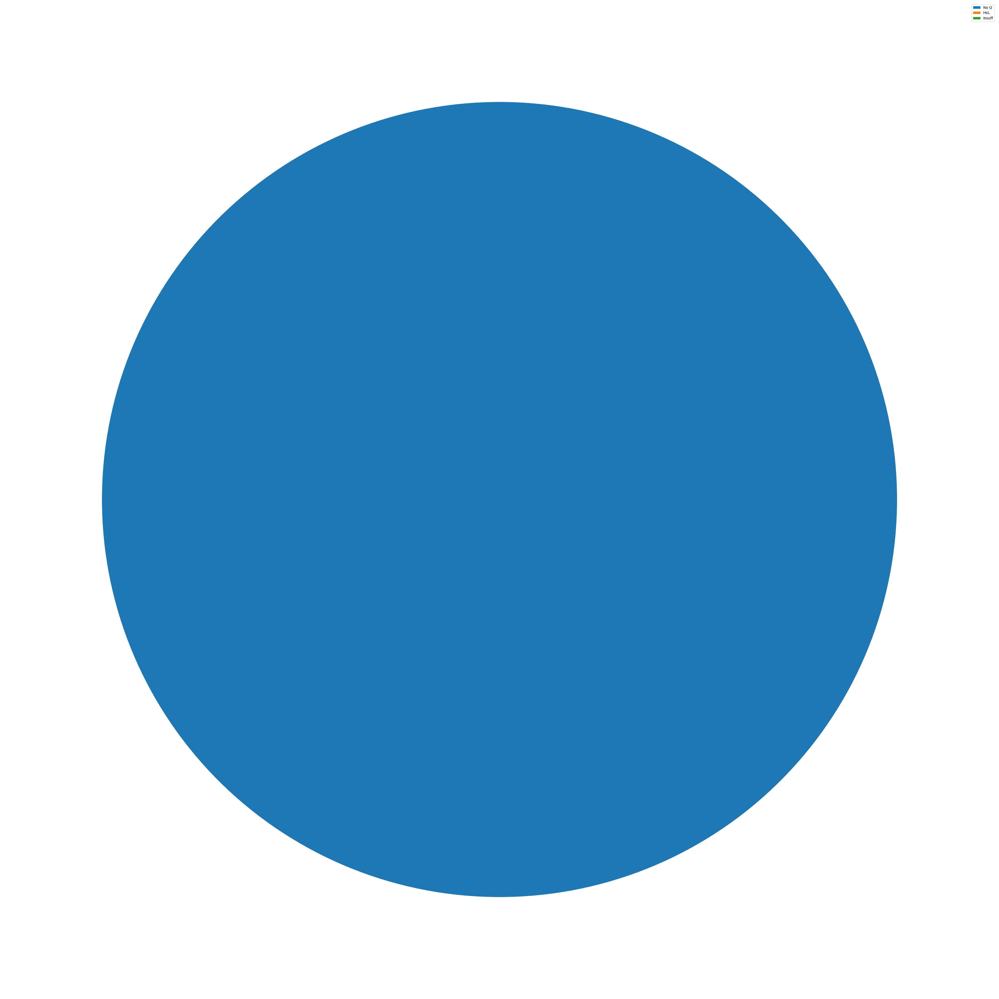

Total Cloud Cost: 163584.6486111111
Total Wasted Space: 37104.09522963283
No Q: 33928.30976140682
HoL: 12020.915334460162
Insuff: 719.3607365846174


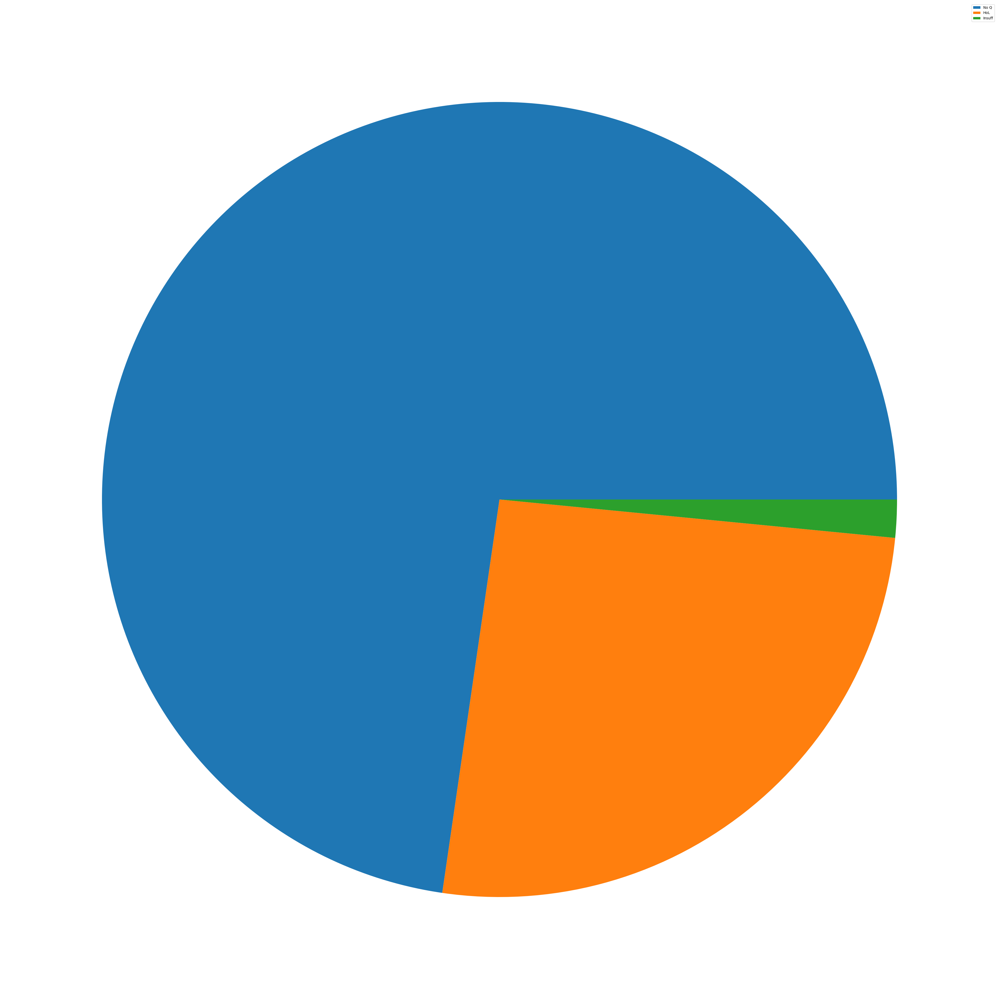

Total Cloud Cost: 174130.56027777796
Total Wasted Space: 46668.585832451594
No Q: 23085.00741457489
HoL: 32821.394140849094
Insuff: 515.7664768962104


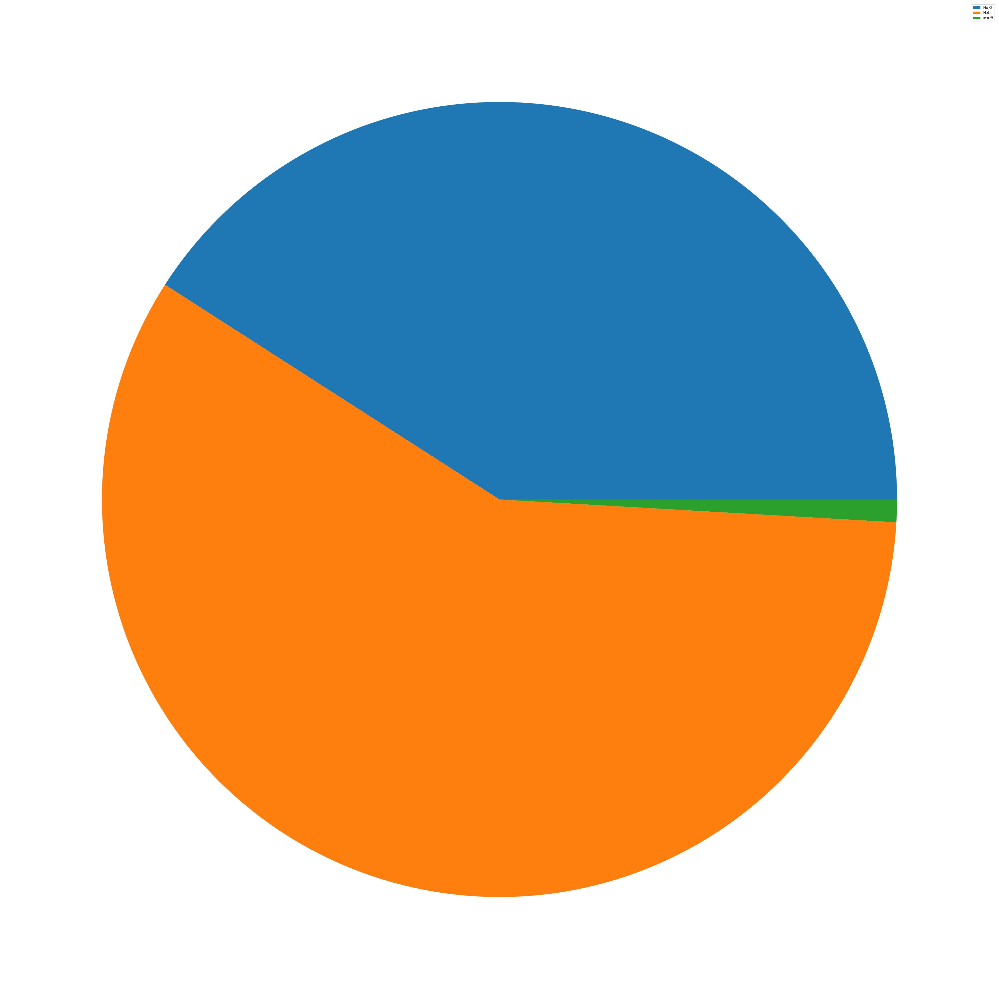

Total Cloud Cost: 185275.1741666665
Total Wasted Space: 56422.1680323202
No Q: 6524.819521101356
HoL: 62825.55688726037
Insuff: 271.82501673037564


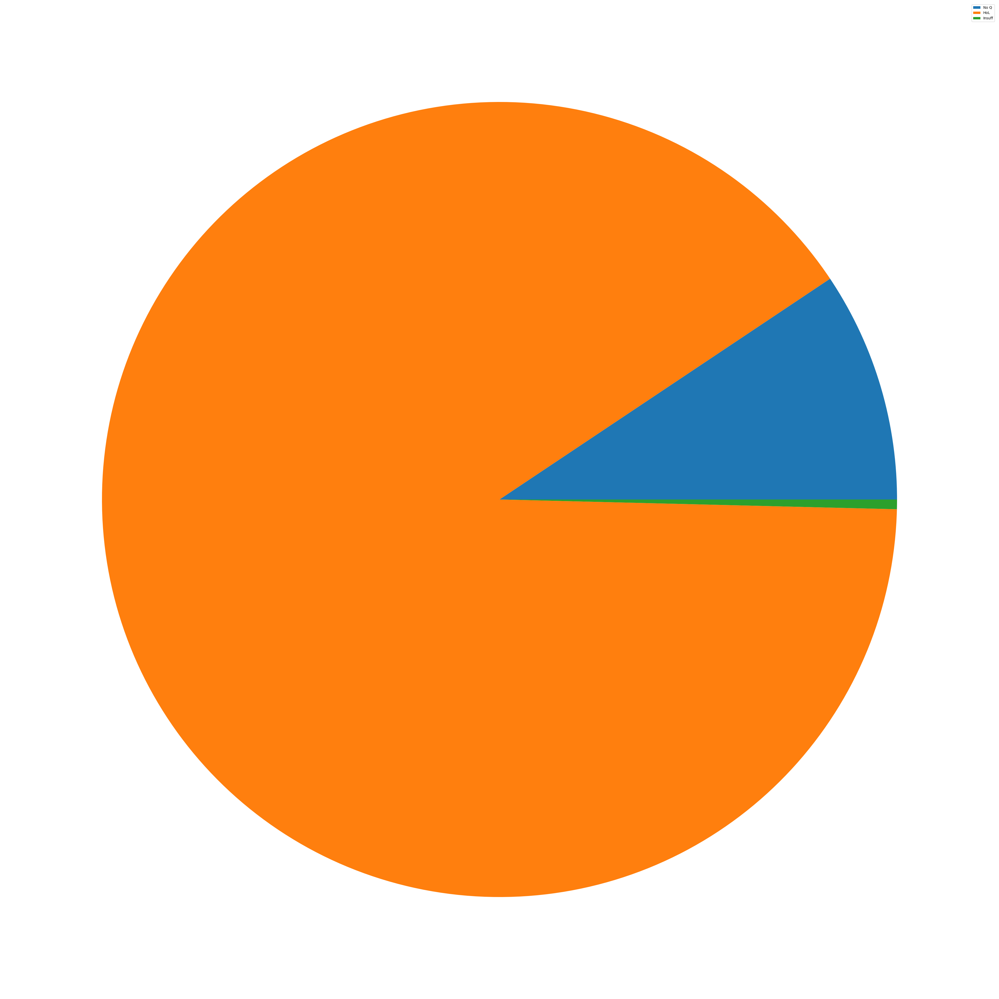

Total Cloud Cost: 188990.42555555556
Total Wasted Space: 69622.2014250921
No Q: 0
HoL: 76167.1650290043
Insuff: 0


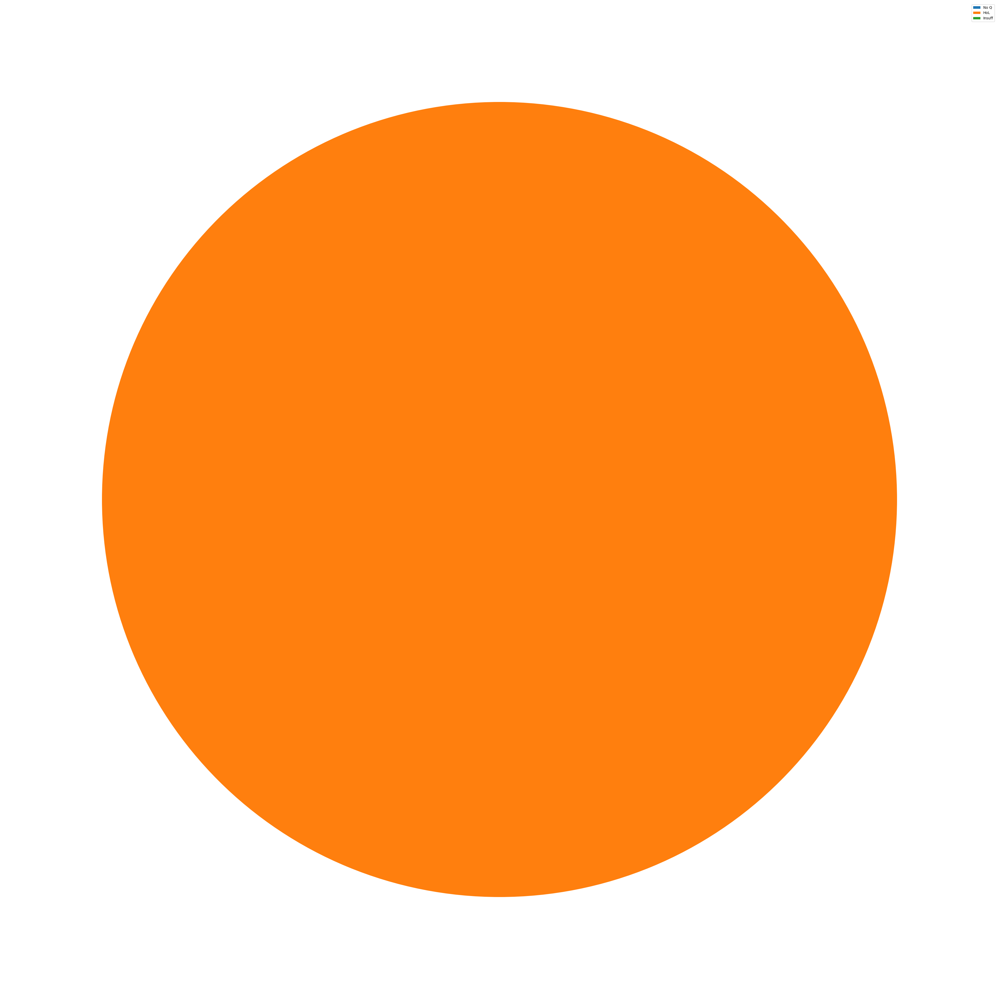

Total Cloud Cost: 197969.6338888892
Total Wasted Space: 76167.1650290043


In [7]:
over_dict_temp = {}
for c_hours in [0,1,2,4,8]:
    temp = vary_overload_waiting_time[c_hours]
    over_dict_temp[c_hours] = plot_empty_space(temp[1], 64, temp[2], plot=False)

{0: {'No Q': 37104.09522963283, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 163584.6486111111}, 1: {'No Q': 33928.30976140682, 'HoL': 12020.915334460162, 'Insuff': 719.3607365846174, 'cloud_cost': 174130.56027777796}, 2: {'No Q': 23085.00741457489, 'HoL': 32821.394140849094, 'Insuff': 515.7664768962104, 'cloud_cost': 185275.1741666665}, 4: {'No Q': 6524.819521101356, 'HoL': 62825.55688726037, 'Insuff': 271.82501673037564, 'cloud_cost': 188990.42555555556}, 8: {'No Q': 0, 'HoL': 76167.1650290043, 'Insuff': 0, 'cloud_cost': 197969.6338888892}}


/tmp/ipykernel_55367/1214854542.py:257: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax1.yaxis.grid(False, color='#EEEEEE')


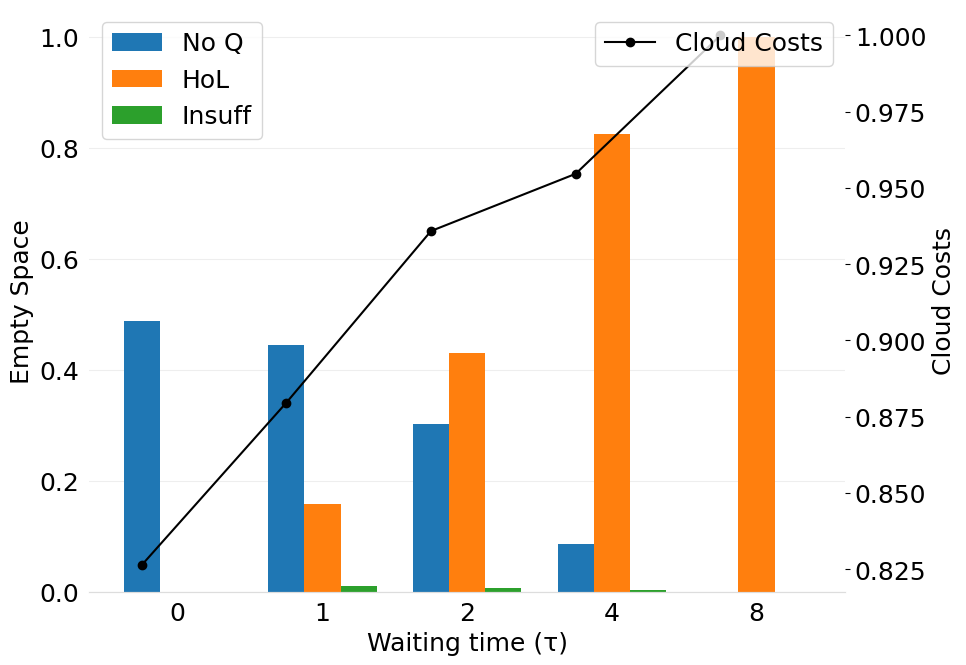

In [34]:
print(over_dict_temp)
plot_empty_cost_bar(over_dict_temp, file_path = 'figures/motivation/high_load.pdf')

In [14]:
vary_low_waiting_time = {}
for c_hours in [0,1,2,4,8]:
    const_fn = lambda x, y, z: deadline_constant_fn(x,y,z,wait_time=c_hours)
    low_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=20.0, deadline_fn=const_fn)
    print(len(golden_jobs_proc))
    vary_low_waiting_time[c_hours] = continuous_simulator(low_jobs_proc, 'fifo', 64, snapshot=True)

119414
fifo-64
Cloud Cost (fifo-64): 0
Avg Waiting Time (fifo-64): 0.0
49931
119414
fifo-64
Cloud Cost (fifo-64): 0
Avg Waiting Time (fifo-64): 0.0
49931
119414
fifo-64
Cloud Cost (fifo-64): 0
Avg Waiting Time (fifo-64): 0.0
49931
119414
fifo-64
Cloud Cost (fifo-64): 0
Avg Waiting Time (fifo-64): 0.0
49931
119414
fifo-64
Cloud Cost (fifo-64): 0
Avg Waiting Time (fifo-64): 0.0
49931


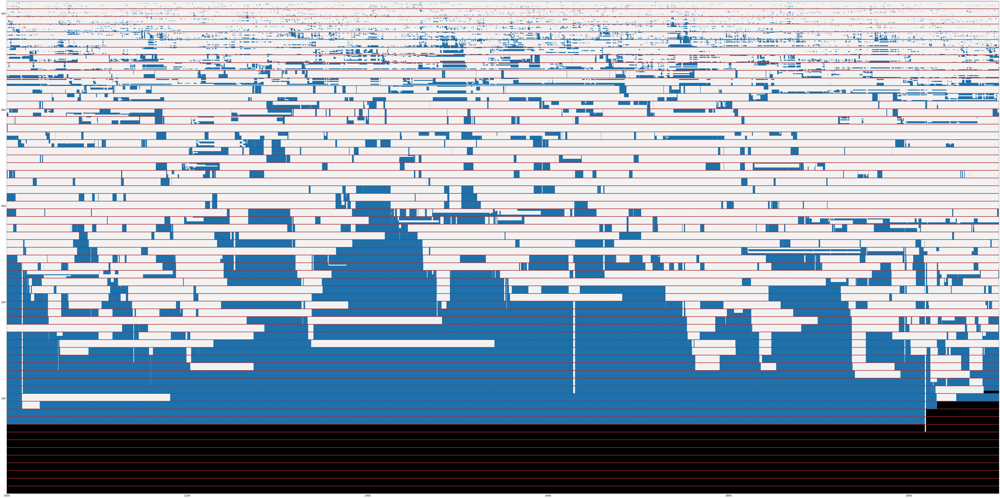

No Q: 142819.1174643516
HoL: 0
Insuff: 0


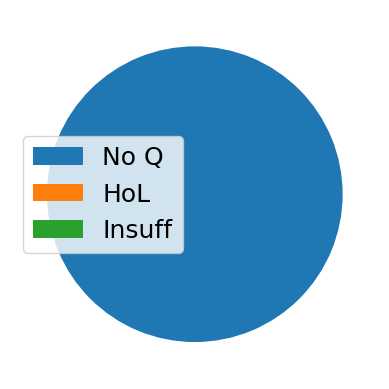

Total Cloud Cost: 0
Total Wasted Space: 142819.1174643516


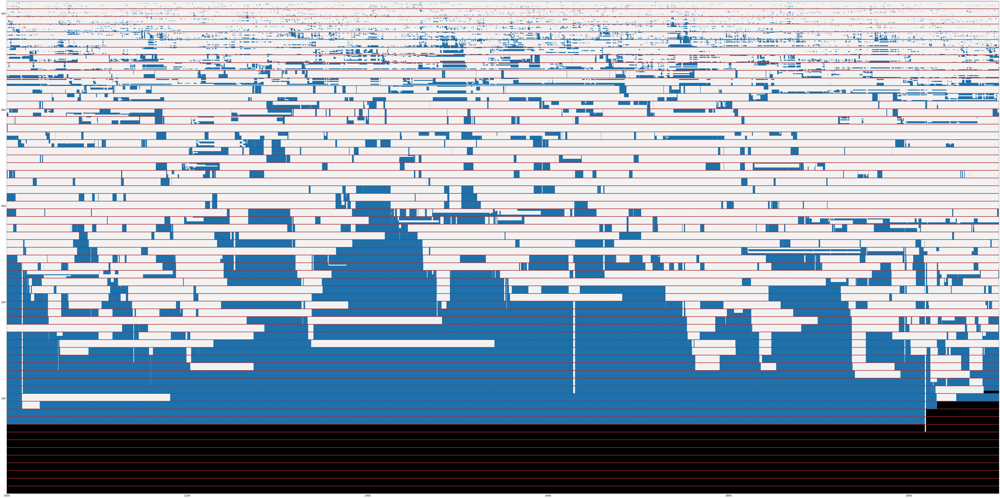

No Q: 142819.1174643516
HoL: 0
Insuff: 0


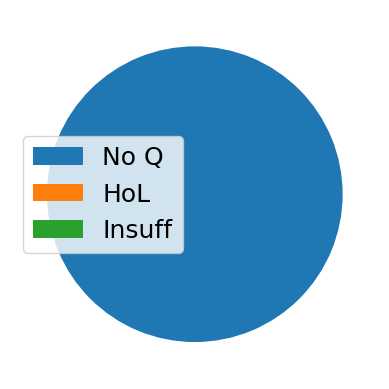

Total Cloud Cost: 0
Total Wasted Space: 142819.1174643516


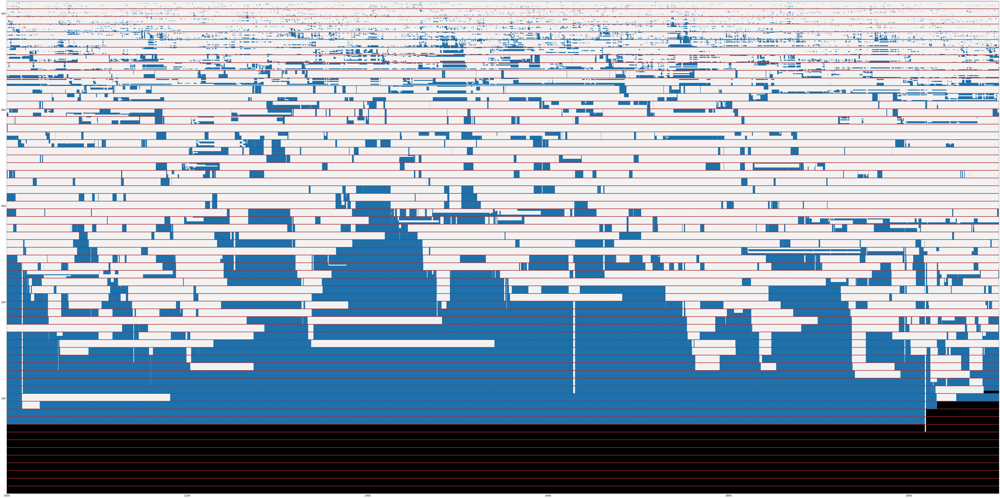

No Q: 142819.1174643516
HoL: 0
Insuff: 0


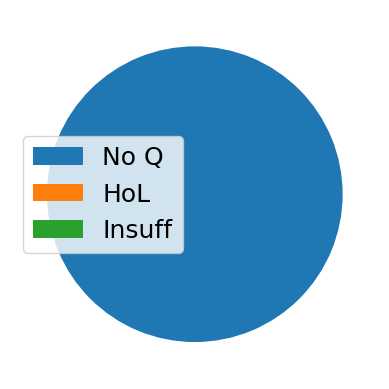

Total Cloud Cost: 0
Total Wasted Space: 142819.1174643516


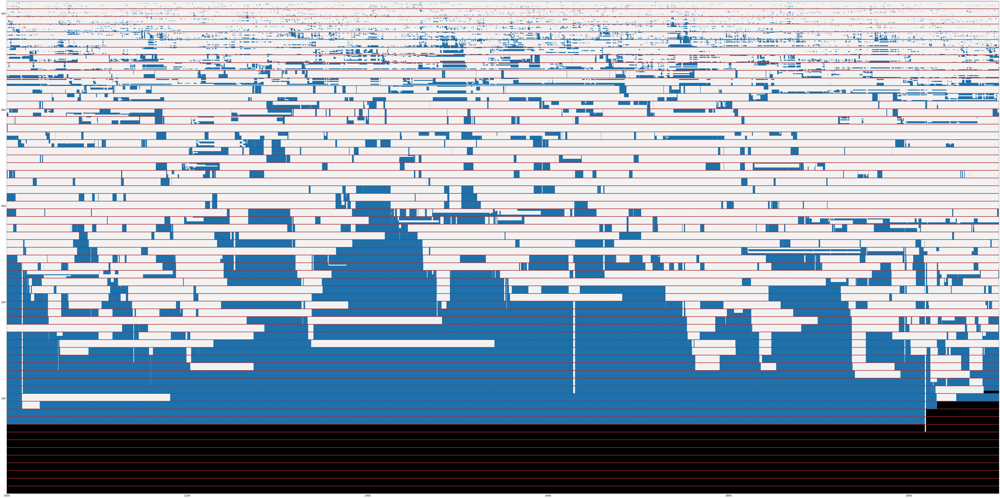

No Q: 142819.1174643516
HoL: 0
Insuff: 0


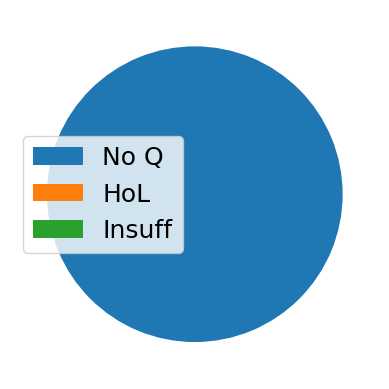

Total Cloud Cost: 0
Total Wasted Space: 142819.1174643516


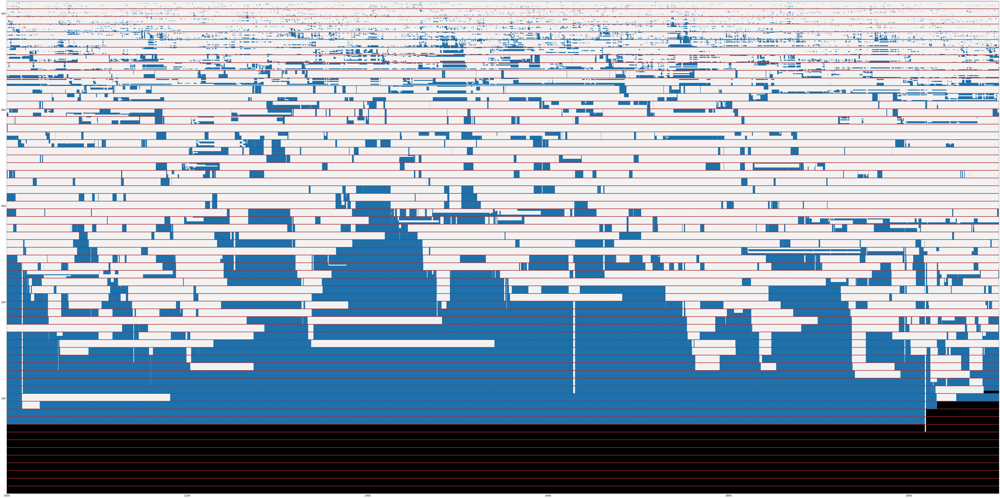

No Q: 142819.1174643516
HoL: 0
Insuff: 0


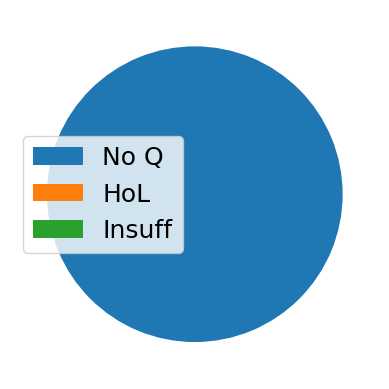

Total Cloud Cost: 0
Total Wasted Space: 142819.1174643516


In [15]:
low_dict_temp = {}
for c_hours in [0,1,2,4,8]:
    temp = vary_low_waiting_time[c_hours]
    low_dict_temp[c_hours] = plot_empty_space(temp[1], 64, temp[2], plot=True)

{0: {'No Q': 142819.1174643516, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 0}, 1: {'No Q': 142819.1174643516, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 0}, 2: {'No Q': 142819.1174643516, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 0}, 4: {'No Q': 142819.1174643516, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 0}, 8: {'No Q': 142819.1174643516, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 0}}


/tmp/ipykernel_55367/1214854542.py:257: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax1.yaxis.grid(False, color='#EEEEEE')


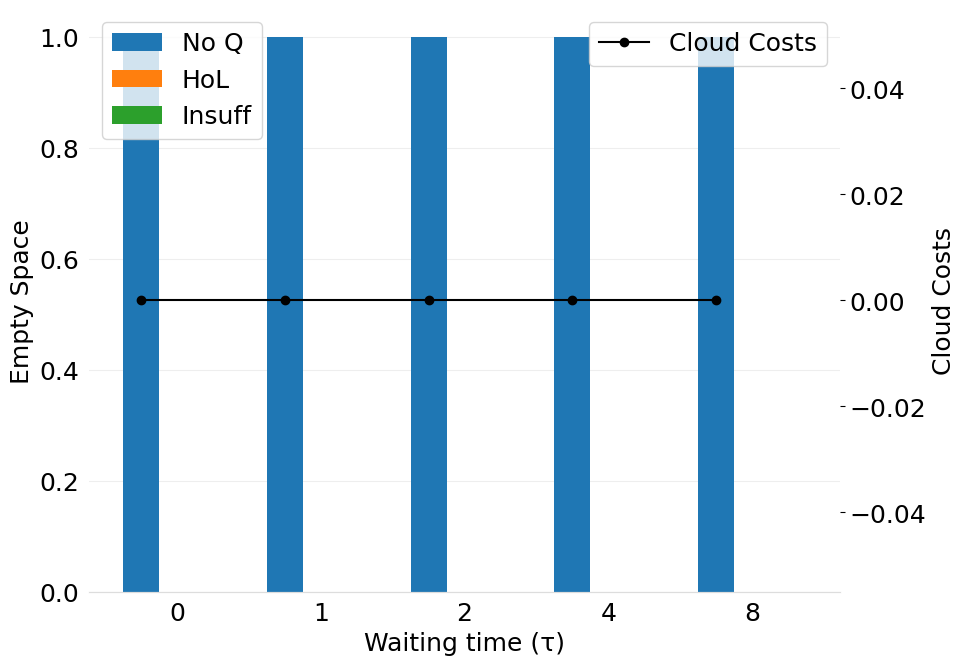

In [35]:
print(low_dict_temp)
plot_empty_cost_bar(low_dict_temp, file_path = 'figures/motivation/low_load.pdf')

In [21]:
# All equilvanet in terms of waiting budget
infinite_fn = lambda x,y,z: deadline_infinite_fn(x,y,z)
temp_fn = lambda x, y, z: deadline_mult_fn(x,y,z,deadline_mult=1.25)
const_fn = lambda x, y, z: deadline_constant_fn(x,y,z,wait_time=1.045615182205313)
linear_capacity_fn = lambda x,y,z: deadline_linear_capacity_fn(x,y,z, deadline_mult=0.7912912710329504)
log_capacity_fn = lambda x,y,z: deadline_log_capacity_fn(x,y,z, deadline_mult=0.9102791702708073)
quad_capacity_fn = lambda x,y,z: deadline_log_capacity_fn(x,y,z, deadline_mult=0.19027535563997805)

# noncongested_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=24.0, deadline_fn=temp_fn)
# congested_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=84.0, deadline_fn=temp_fn)
# golden_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=40.0, deadline_fn=temp_fn)

vary_waiting_time = {}
for c_hours in [0,1,2,4,8]:
    const_fn = lambda x, y, z: deadline_constant_fn(x,y,z,wait_time=c_hours)
    low_jobs_proc = generate_steady_state(all_jobs, max_time=2500, arrival_param=31.0, deadline_fn=const_fn)
    vary_waiting_time[c_hours] = continuous_simulator(low_jobs_proc, 'fifo', 64, snapshot=True)

fifo-64
Cloud Cost (fifo-64): 25361.857777777786
Avg Waiting Time (fifo-64): 0.0
77202
fifo-64
Cloud Cost (fifo-64): 18580.855277777784
Avg Waiting Time (fifo-64): 0.014031768652892157
77202
fifo-64
Cloud Cost (fifo-64): 19599.95388888889
Avg Waiting Time (fifo-64): 0.06307318767819002
77202
fifo-64
Cloud Cost (fifo-64): 19457.67055555556
Avg Waiting Time (fifo-64): 0.2322153827655388
77202
fifo-64
Cloud Cost (fifo-64): 16085.08444444444
Avg Waiting Time (fifo-64): 1.063931887234633
77202


No Q: 72671.52538923622
HoL: 0
Insuff: 0


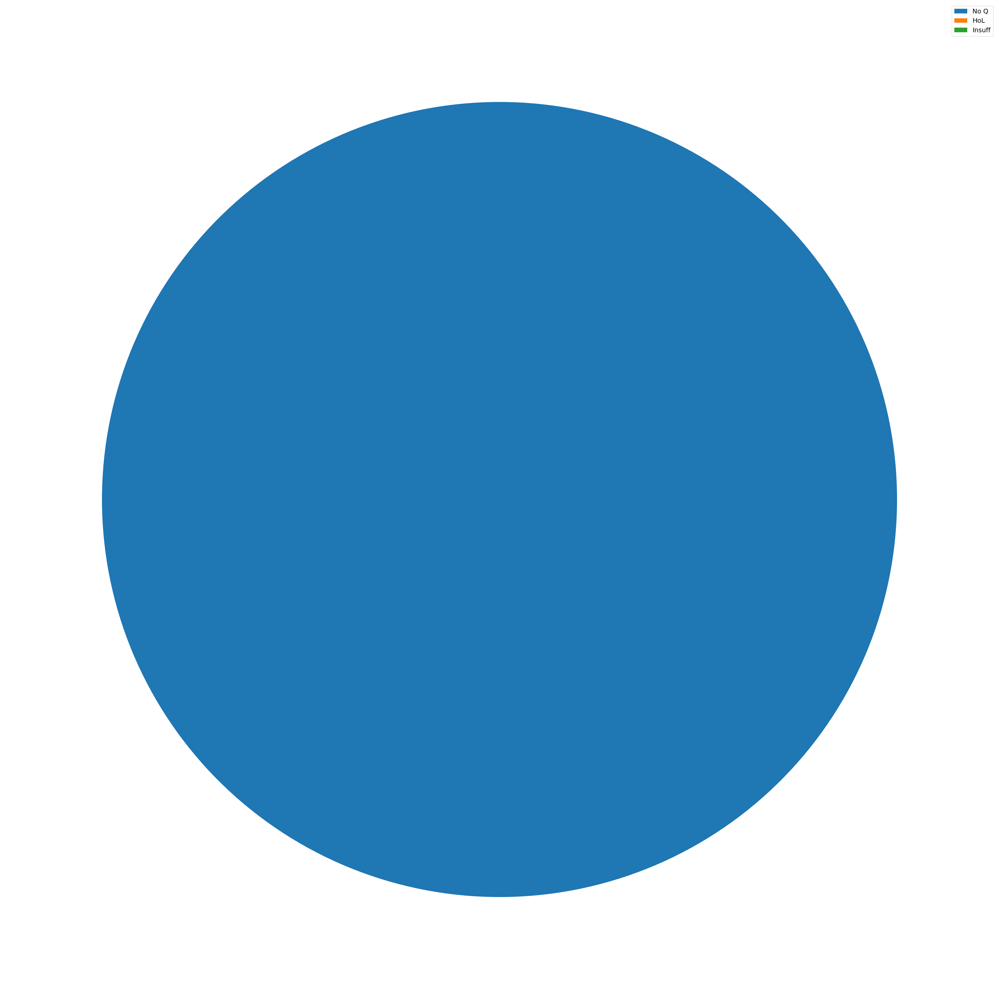

Total Cloud Cost: 20820.46888888889
Total Wasted Space: 72671.52538923622
No Q: 66310.57160673103
HoL: 1442.1982999270406
Insuff: 94.77277517240555


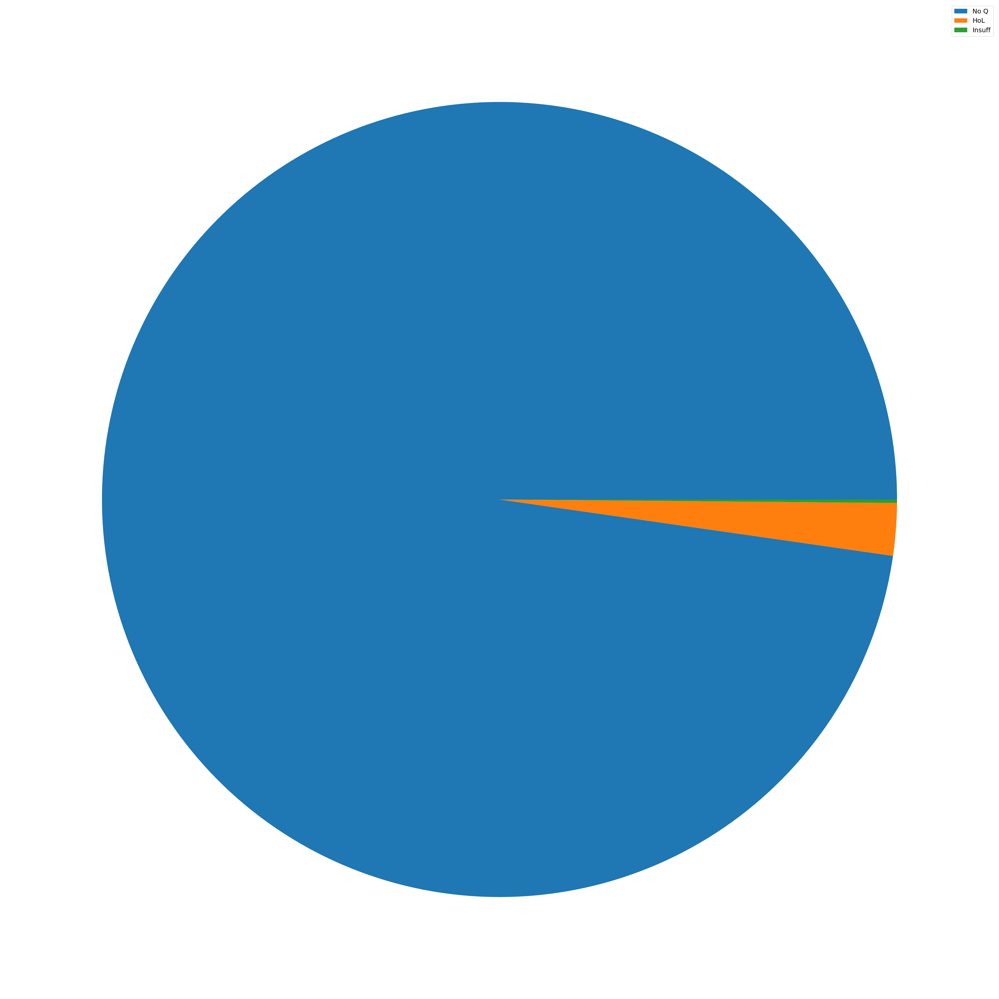

Total Cloud Cost: 14780.041944444445
Total Wasted Space: 67847.54268183047
No Q: 65578.60392725006
HoL: 4277.162015708345
Insuff: 420.93120082502264


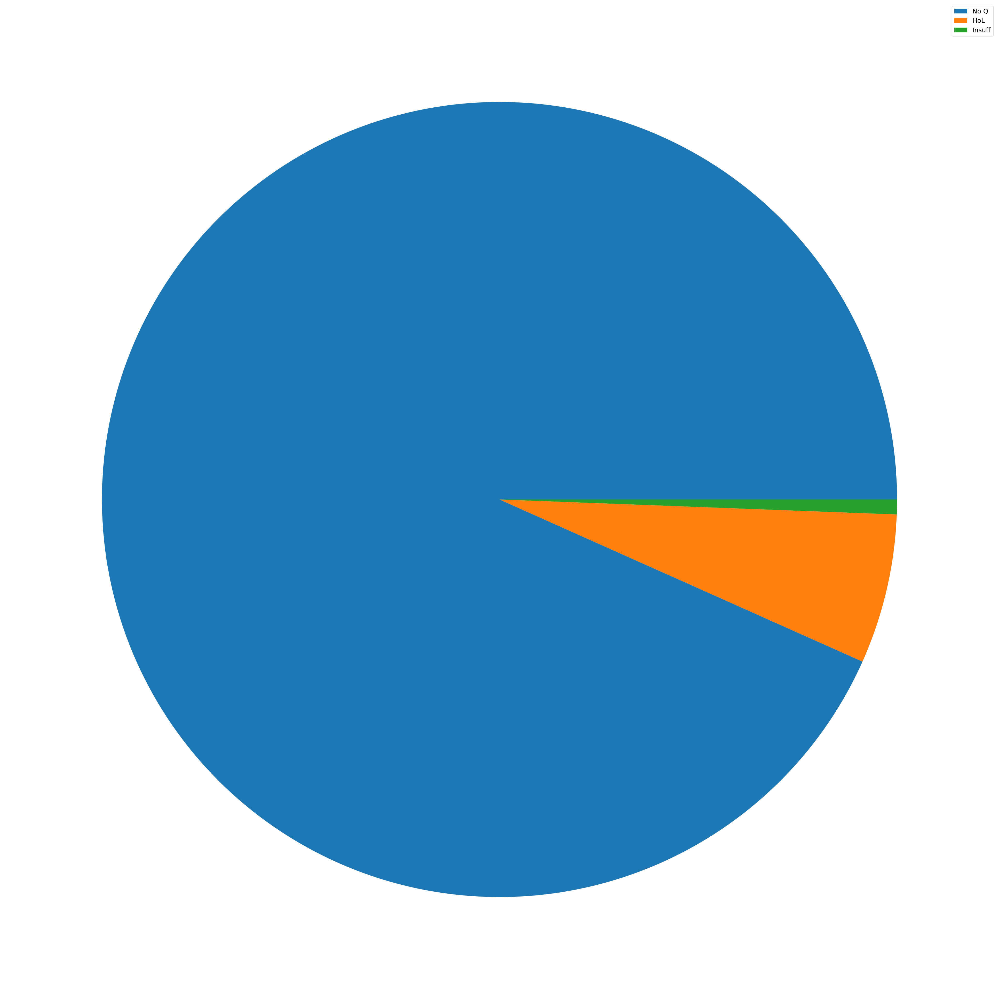

Total Cloud Cost: 17673.192777777775
Total Wasted Space: 70276.69714378344
No Q: 58157.48709185451
HoL: 8272.426885372293
Insuff: 402.8125496711898


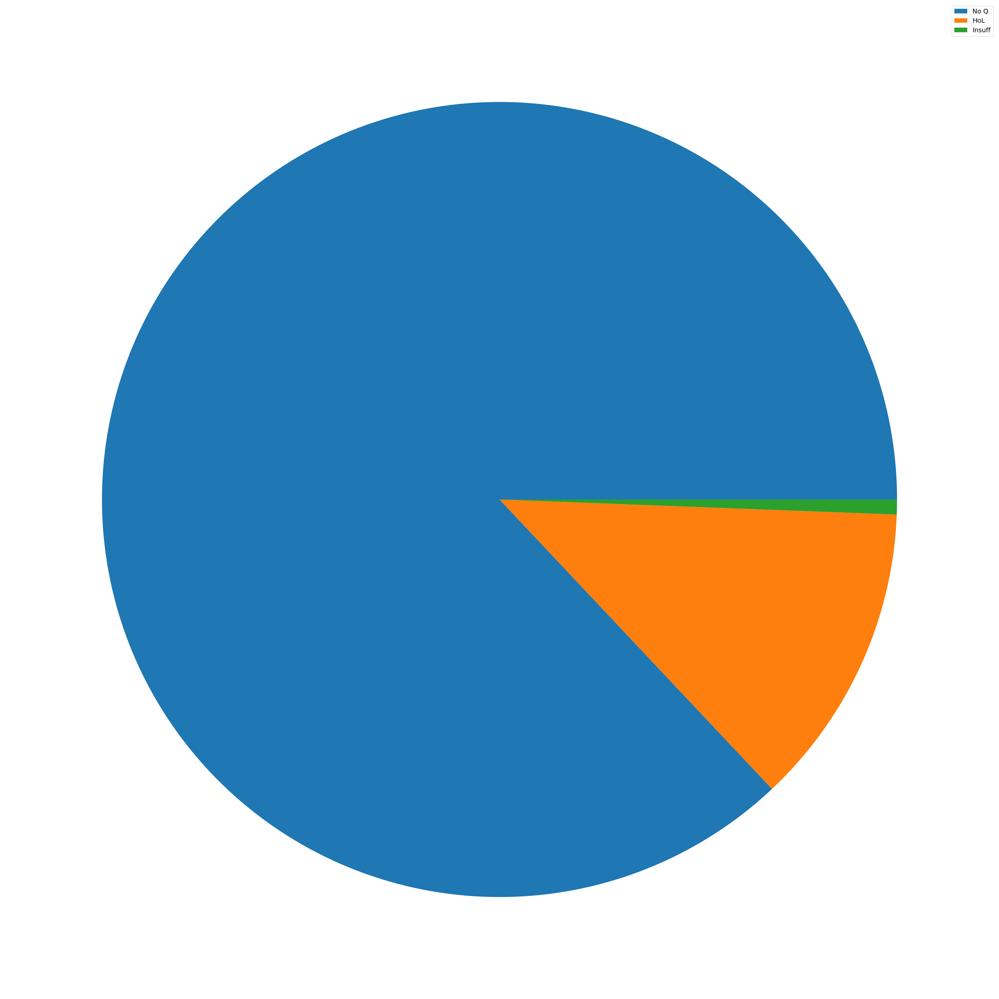

Total Cloud Cost: 13213.85777777778
Total Wasted Space: 66832.726526898
No Q: 49330.699592243785
HoL: 25191.689750847378
Insuff: 214.44056291089692


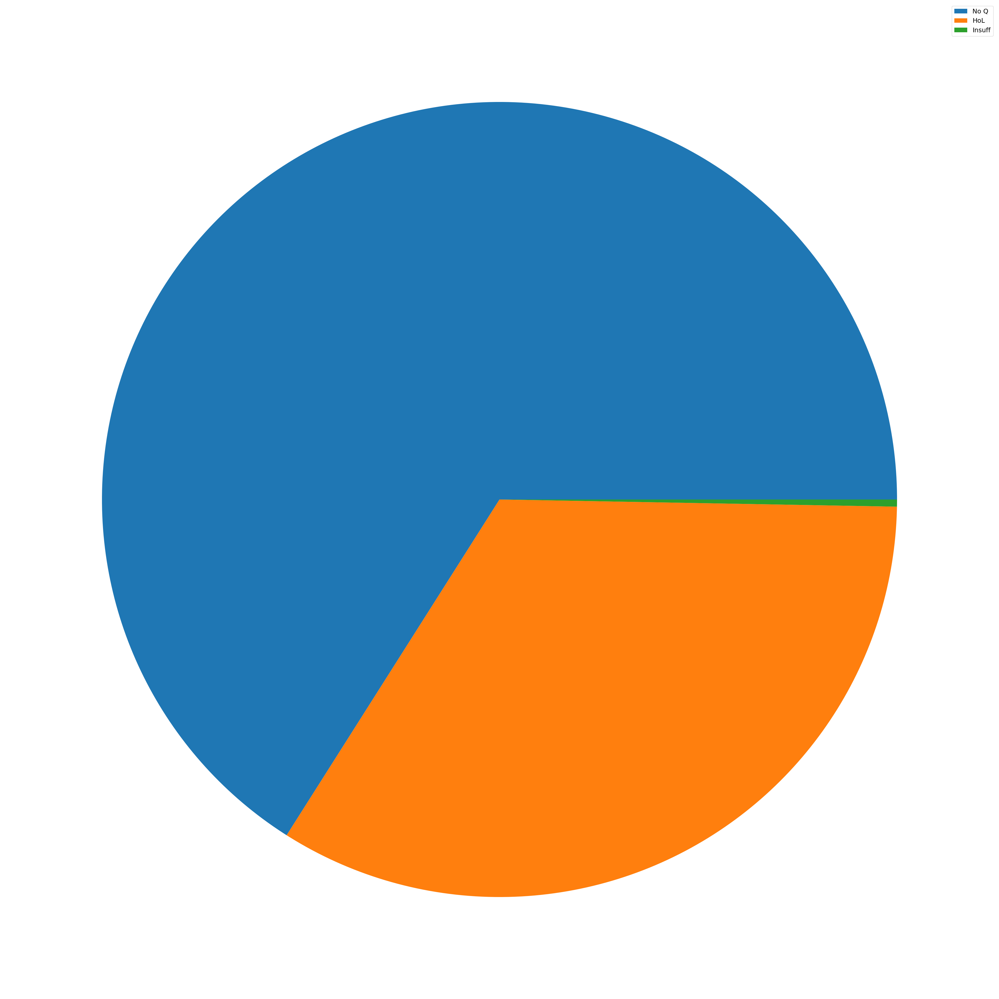

Total Cloud Cost: 13584.778333333328
Total Wasted Space: 74736.82990600207


In [22]:
dict_temp = {}
for c_hours in [0,1,2,4,8]:
    temp = vary_waiting_time[c_hours]
    dict_temp[c_hours] = plot_empty_space(temp[1], 64, temp[2], plot=False)

{0: {'No Q': 72671.52538923622, 'HoL': 0, 'Insuff': 0, 'cloud_cost': 20820.46888888889}, 1: {'No Q': 66310.57160673103, 'HoL': 1442.1982999270406, 'Insuff': 94.77277517240555, 'cloud_cost': 14780.041944444445}, 2: {'No Q': 65578.60392725006, 'HoL': 4277.162015708345, 'Insuff': 420.93120082502264, 'cloud_cost': 17673.192777777775}, 4: {'No Q': 58157.48709185451, 'HoL': 8272.426885372293, 'Insuff': 402.8125496711898, 'cloud_cost': 13213.85777777778}, 8: {'No Q': 49330.699592243785, 'HoL': 25191.689750847378, 'Insuff': 214.44056291089692, 'cloud_cost': 13584.778333333328}}


/tmp/ipykernel_55367/1214854542.py:257: UserWarning: First parameter to grid() is false, but line properties are supplied. The grid will be enabled.
  ax1.yaxis.grid(False, color='#EEEEEE')


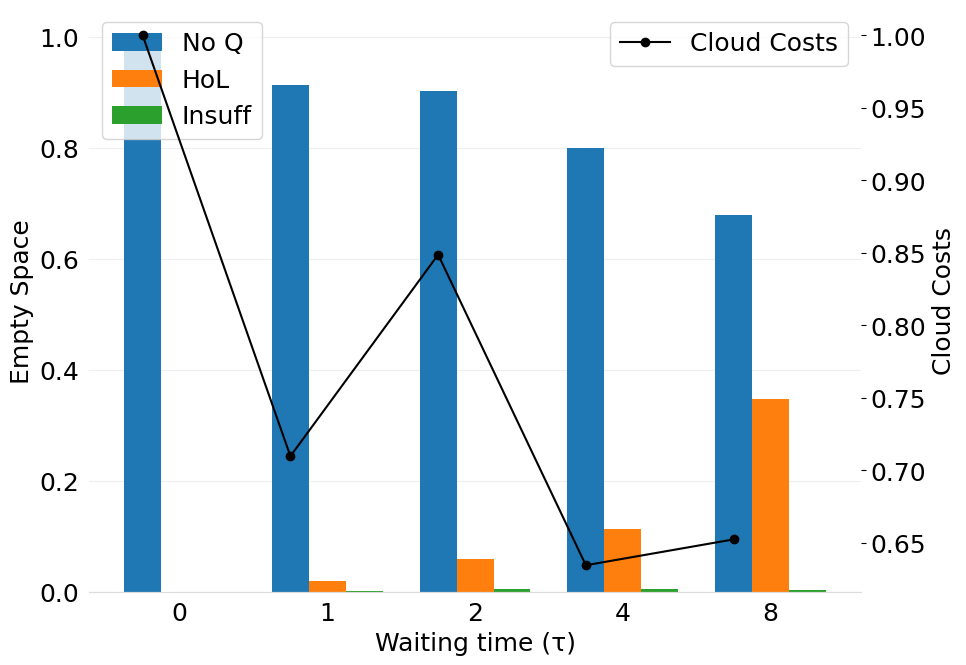

In [37]:
print(dict_temp)
plot_empty_cost_bar(dict_temp, file_path = 'figures/motivation/medium_load.pdf')